# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [572]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [573]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5, 1.0, 'Original Image')

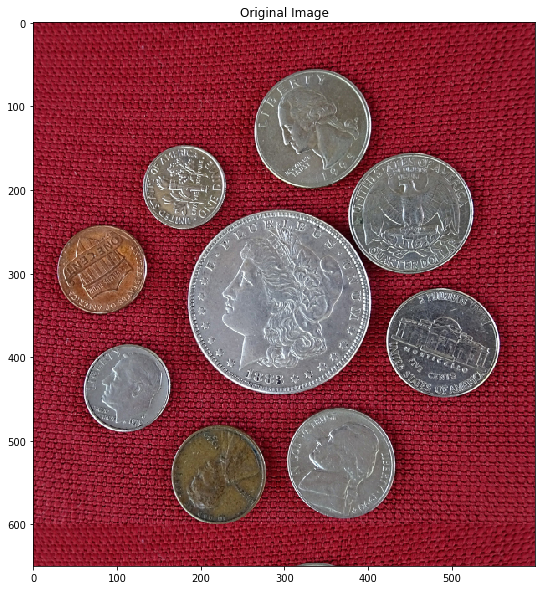

In [574]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
image = cv2.imread(imagePath)
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [575]:
# Convert image to grayscale
# Store it in the variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


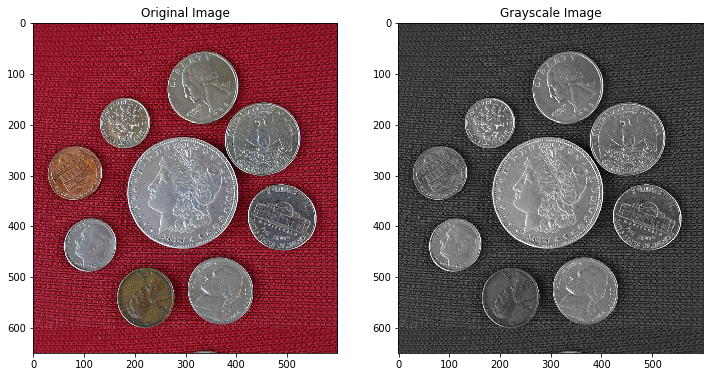

In [576]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [577]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
imageB, imageG, imageR = cv2.split(image)

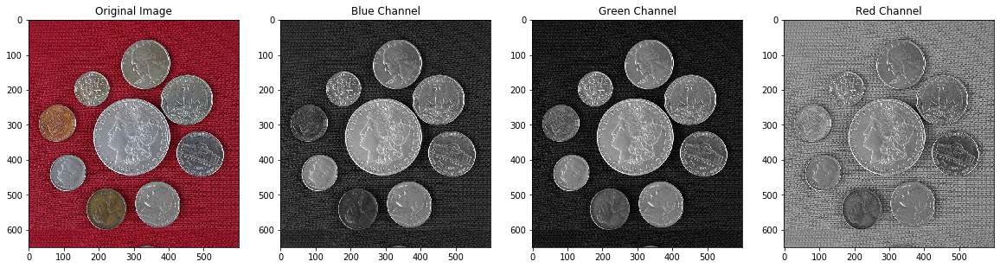

In [578]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

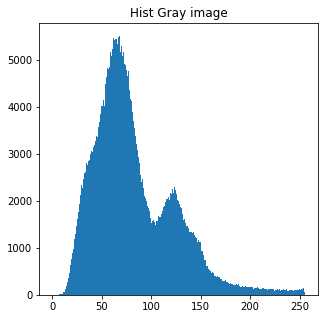

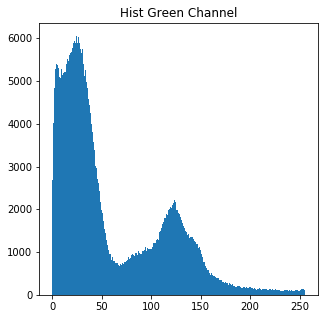

In [579]:
'''
    Goal: to have an image that is black (low pixel value) where is a coin 
    and while(high pixel value) around the background. So this indicates that
    we need some sort of inversion and binary thresholding. 
    
    Color space choice. BY looking at all the color spaces, we can observe that 
    the best candidates are the green channel and the grayscale image, due to their contrast. 
    
    Now let's do some experiments on these channels and try to get the best output. 
'''
# step 1: Let's do a histogram visualization 
plt.figure(figsize=(5,5))
plt.subplot(111)
plt.title("Hist Gray image")
plt.hist(imageGray.ravel(),256,[0,256]); 
plt.show()
plt.figure(figsize=(5,5))
plt.subplot(111)
plt.title("Hist Green Channel")
plt.hist(imageG.ravel(),256,[0,256]); 
plt.show()


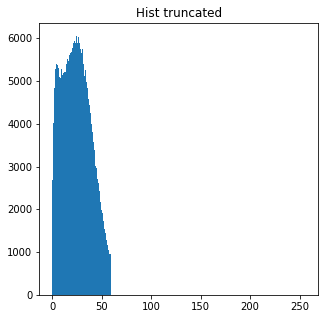

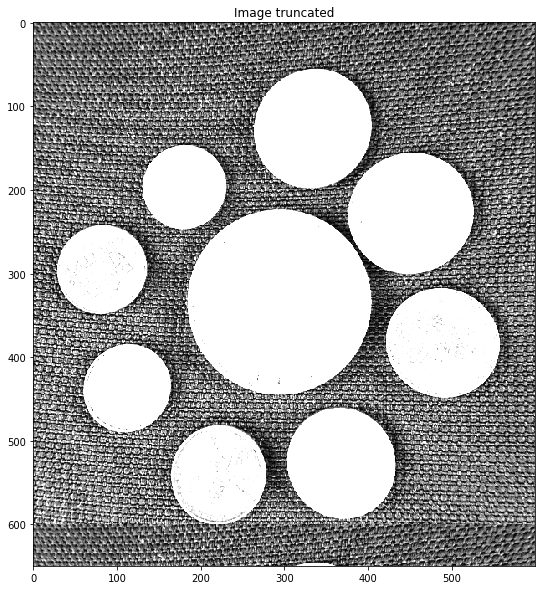

In [580]:
'''
    From the above historgrams, we can see the distribution of pixels follos
    a binormal-distribution, where we have two means around 40 and 125. The 
    brighter pixels seem to have a larger standard deviation so we can account 
    for this using a wide range of pixels. 
'''
# Step2: Experiment on green channel, since we have a good bi-normal distribution of pixels 
# Step2.1: Let's threshold truncate
# truncate thresholding. We can pick a threshold value of 60, which an approximate lower tail of high 
# pixel value distributions. 
th, interm_img_1 = cv2.threshold(imageG, 60, 255, cv2.THRESH_TRUNC)
plt.figure(figsize=(5,5))
plt.subplot(111)
plt.title("Hist truncated")
# let's plot the histrogram, ignore values which are 60 since they will messup the scale
plt.hist(interm_img_1.ravel()[interm_img_1.ravel()!=60],256,[0,256]); 
plt.show()
plt.imshow(interm_img_1);
plt.title("Image truncated");


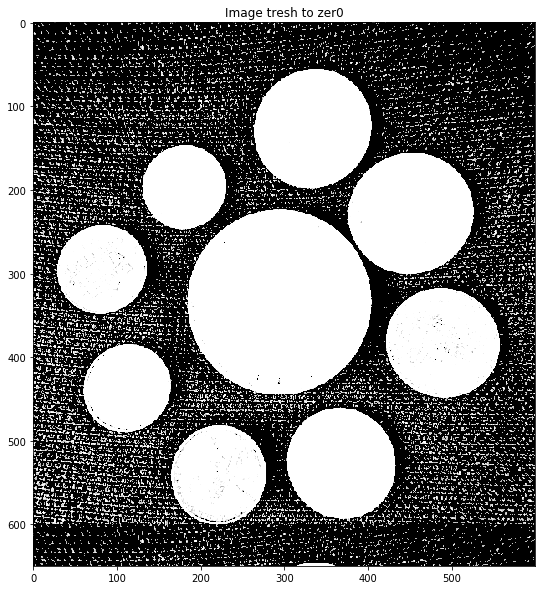

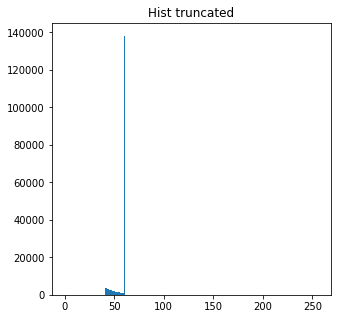

In [581]:
'''
    From the above picture, we can see that we a have nice sepration. 
    Let's do further cleaning by cleaning doing tresh to zero
'''
th, interm_img_2 = cv2.threshold(interm_img_1, 40, 255, cv2.THRESH_TOZERO)
plt.imshow(interm_img_2);
plt.title("Image tresh to zer0");

plt.figure(figsize=(5,5))
plt.subplot(111)
plt.title("Hist truncated")
# let's plot the histrogram, ignore values which are 60 since they will messup the scale
plt.hist(interm_img_2.ravel()[ 0 != interm_img_2.ravel() ],256,[0,256]); 


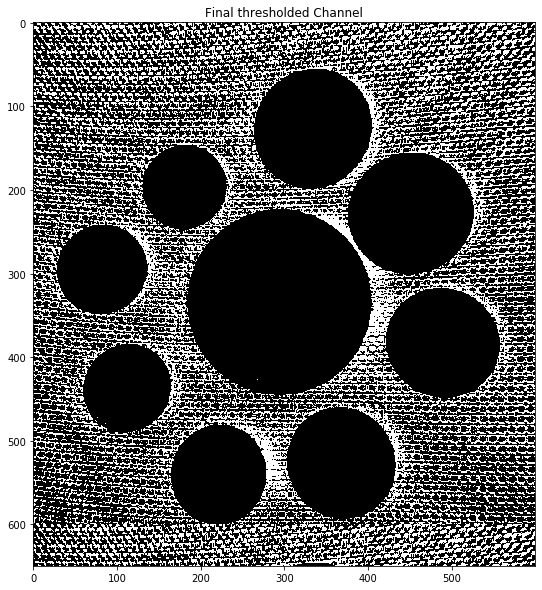

In [582]:
'''
    We can now do an inverse binary thresholding on the first image. This 
    will change the coin areas appear as black. We can select a threshold low enough
    so that black points on the white coins appear as black
'''
th, imageG_th = cv2.threshold(interm_img_1, 20, 255, cv2.THRESH_BINARY_INV)
plt.imshow(imageG_th);
plt.title("Final thresholded Channel");

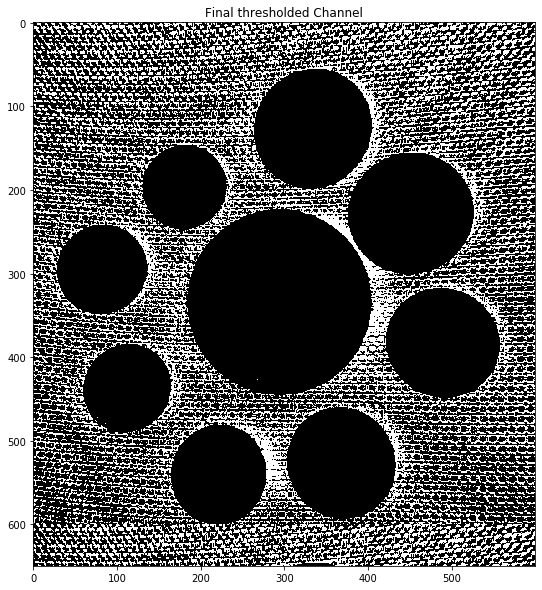

In [583]:
# Display the thresholded image
plt.imshow(imageG_th);
plt.title("Final thresholded Channel");


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

Text(0.5, 1.0, 'Image dilated 2 (Elipse (3,3))')

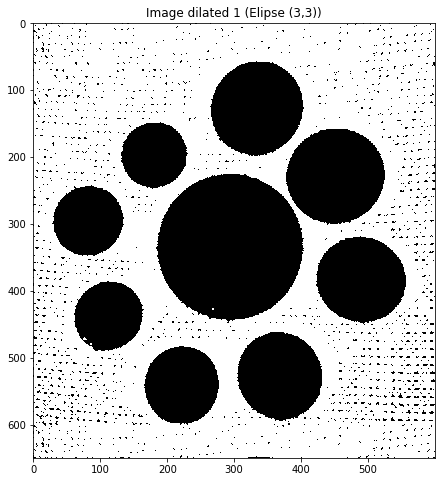

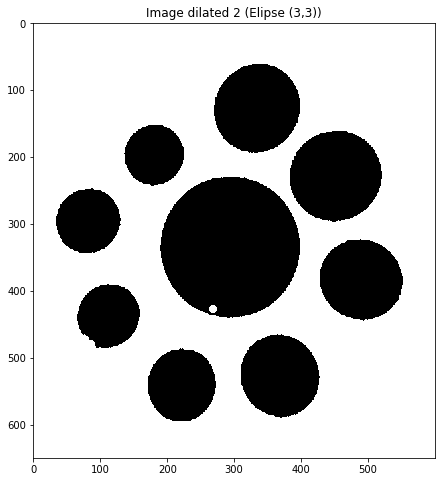

In [584]:
'''
    Let's increase our white region, by performing dilation
'''
# an elipse of size (3,3)
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
image_dilated_1 = cv2.dilate(imageG_th, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_dilated_1);
plt.title("Image dilated 1 (Elipse (3,3))")
# an elipse of size (7,7)
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
image_dilated_2 = cv2.dilate(imageG_th, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_dilated_2);
plt.title("Image dilated 2 (Elipse (3,3))")

Text(0.5, 1.0, 'Image dilated 4 (Rect (7,7))')

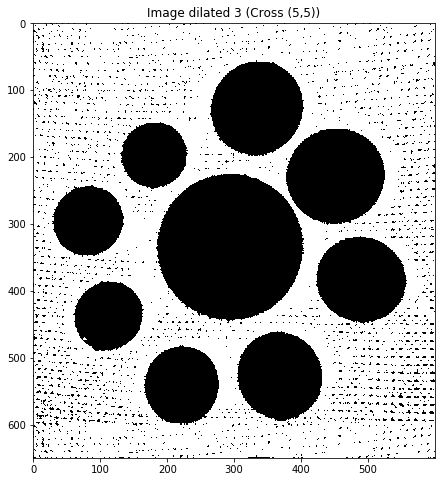

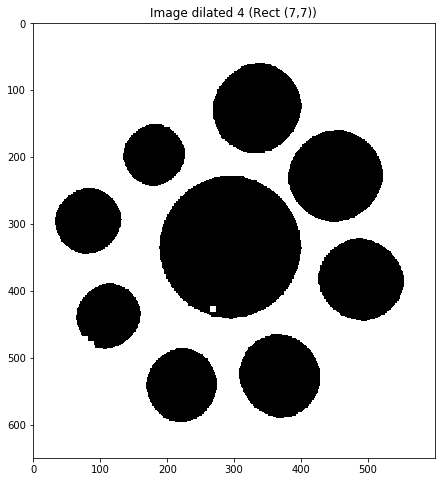

In [585]:
'''
    Above we can see we still have some spots. Let's try different structures 
'''
# an cross of size (5,5)
element = cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))
image_dilated_3 = cv2.dilate(imageG_th, element)
plt.figure(figsize=(8,8))
plt.imshow(image_dilated_3);
plt.title("Image dilated 3 (Cross (5,5))")
# an elipse of size (7,7)
element = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
image_dilated_4 = cv2.dilate(imageG_th, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_dilated_4);
plt.title("Image dilated 4 (Rect (7,7))")

Text(0.5, 1.0, 'Image dilated 2 (Elipse (3,3))')

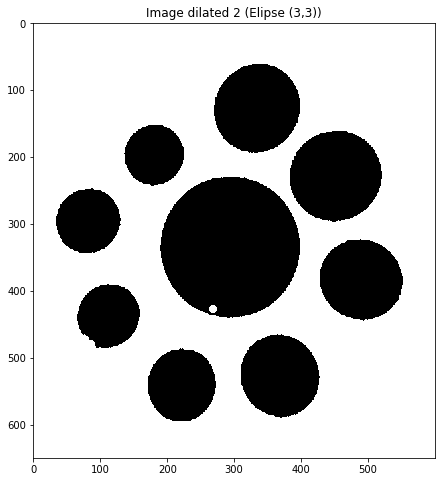

In [586]:
# Display all the images
# All the images are displayed above
# Form all the images,  the best output is an elipse of size (7,7). The Rect element 
# also does a good job of dilating but the circles are distorted
# 
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
image_dilated_2 = cv2.dilate(imageG_th, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_dilated_2);
plt.title("Image dilated 2 (Elipse (3,3))")

Text(0.5, 1.0, 'Image eroded 2 (Elipse (3,3))')

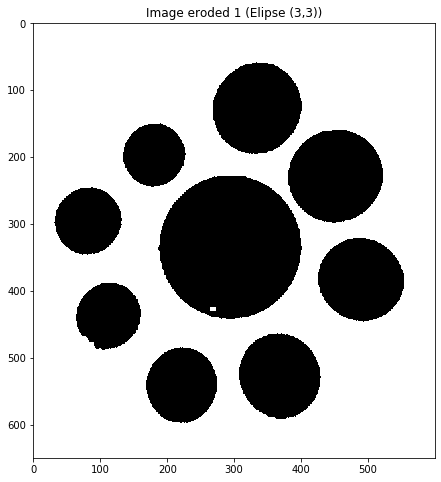

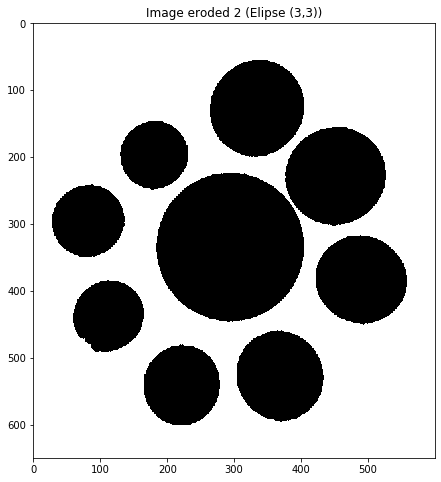

In [587]:
'''
    Let's remove white region spots, by performing erosion
'''
# an elipse of size (3,3)
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
image_eroded_1 = cv2.erode(image_dilated_2, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_eroded_1);
plt.title("Image eroded 1 (Elipse (3,3))")
# an elipse of size (7,7)
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
image_eroded_2 = cv2.erode(image_dilated_2, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_eroded_2);
plt.title("Image eroded 2 (Elipse (3,3))")


Text(0.5, 1.0, 'Image eroded 4 (Rect (7,7))')

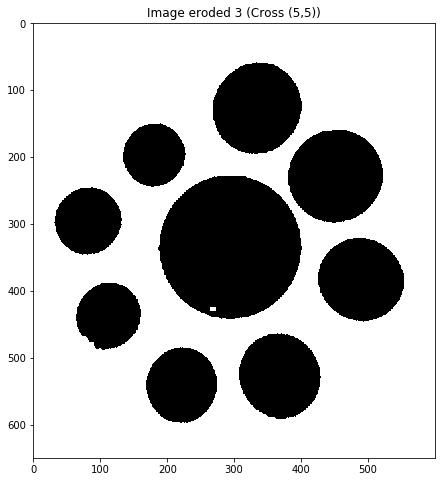

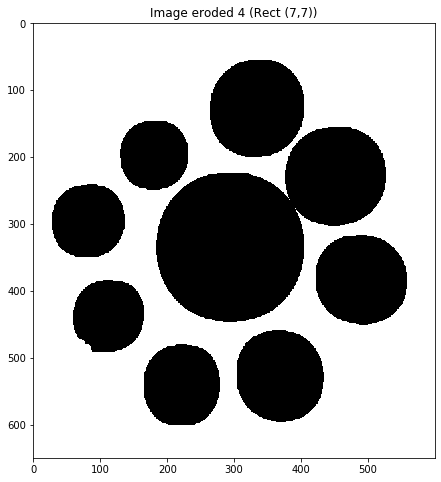

In [588]:
'''
    Results above are good. But let's try some other structures before moving on
'''
# an cross of size (5,5)
element = cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))
image_eroded_3 = cv2.erode(image_dilated_2, element)
plt.figure(figsize=(8,8))
plt.imshow(image_eroded_3);
plt.title("Image eroded 3 (Cross (5,5))")
# an elipse of size (7,7)
element = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
image_eroded_4 = cv2.erode(image_dilated_2, element, iterations=2)
plt.figure(figsize=(8,8))
plt.imshow(image_eroded_4);
plt.title("Image eroded 4 (Rect (7,7))")

Text(0.5, 1.0, 'Image eroded 3 (Elipse (3,3))')

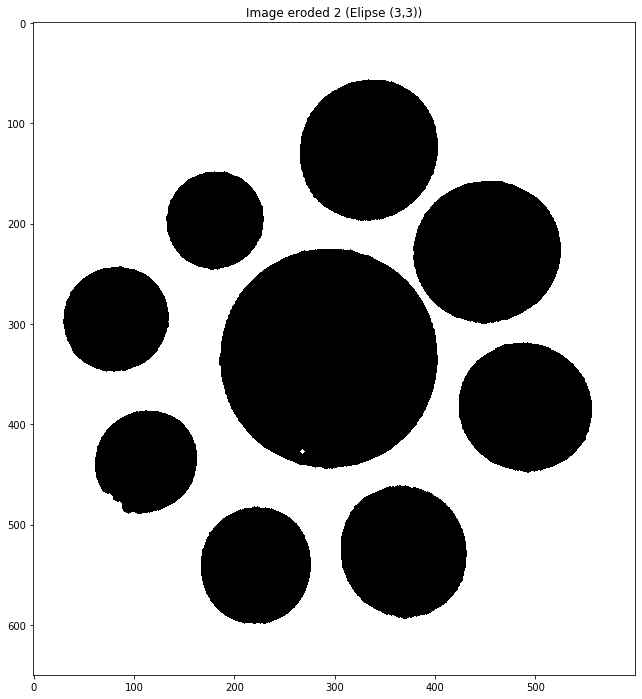

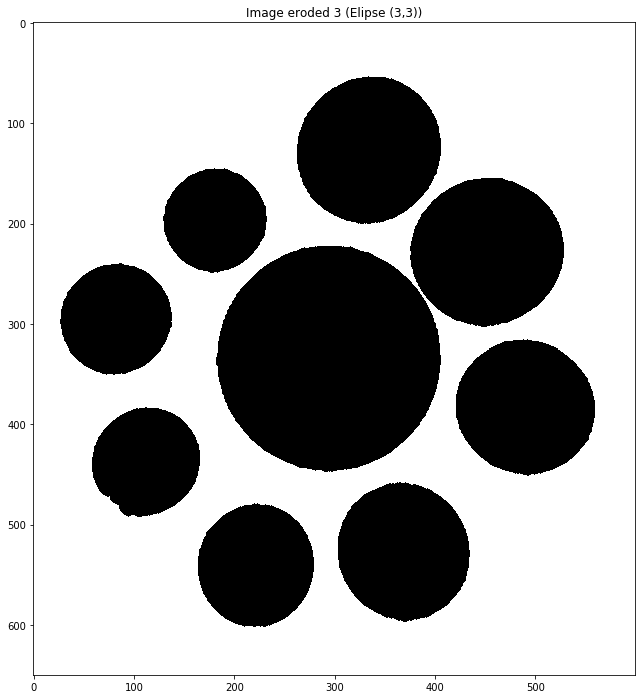

In [589]:
'''
    Again best result is obtained using elipse (7,7) size
'''
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
image_eroded_2 = cv2.erode(image_dilated_2, element, iterations=2)
plt.figure(figsize=(12,12))
plt.imshow(image_eroded_2);
plt.title("Image eroded 2 (Elipse (3,3))")
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
image_eroded_2 = cv2.erode(image_eroded_2, element, iterations=3)
plt.figure(figsize=(12,12))
plt.imshow(image_eroded_2);
plt.title("Image eroded 3 (Elipse (3,3))")

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [590]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2
   
# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [591]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [22]:
# Detect blobs
# get the keypoints from our detector
keypoints = detector.detect(image_eroded_2)


In [23]:
# Print number of coins detected
print("Number of coins detected = %d"%(len(keypoints)))


Number of coins detected = 9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [24]:
# Mark coins using image annotation concepts we have studied so far
image = cv2.imread(imagePath)
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Blue Center point 
    cv2.circle(image,(x,y),5,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Green circle boundary
    cv2.circle(image,(x,y),radius,(0,255,0),2)


Text(0.5, 1.0, 'Final Image ')

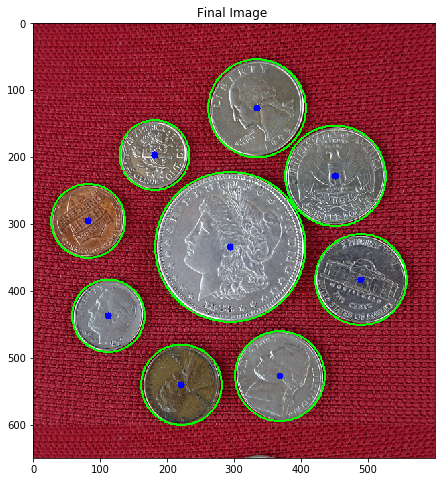

In [25]:
# Display the final image
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")


## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [26]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [528]:
# Find connected components
_, imLabels = cv2.connectedComponents(cv2.bitwise_not(image_eroded_2))

In [529]:
# Print number of connected components detected
print ("Number of connected components detected =%d"%(np.max(imLabels)+1))


Number of connected components detected =10


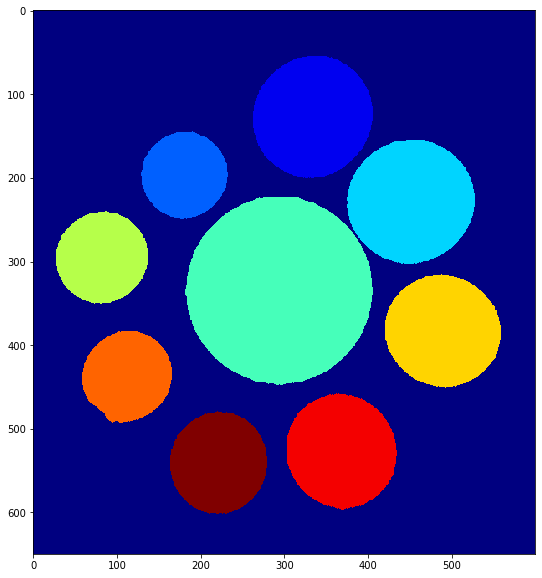

In [530]:
# Display connected components using displayConnectedComponents
# function
displayConnectedComponents(imLabels)


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [30]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(image_eroded_2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)


In [31]:
# Print the number of contours found
print ("Number of contours found =%d"%(len(contours)))


Number of contours found =10


Text(0.5, 1.0, 'Final Image ')

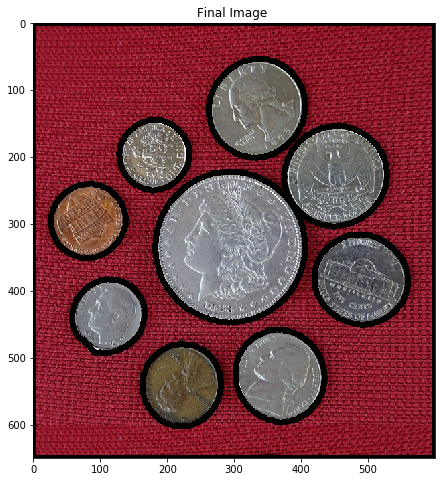

In [32]:
# Draw all contours
# Display the result
image = cv2.imread(imagePath)
cv2.drawContours(image, contours, -1, (0,0,0), 8);
    
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")


Let's only consider the outer contours.

Number of contours found =1


Text(0.5, 1.0, 'Outer contour  ')

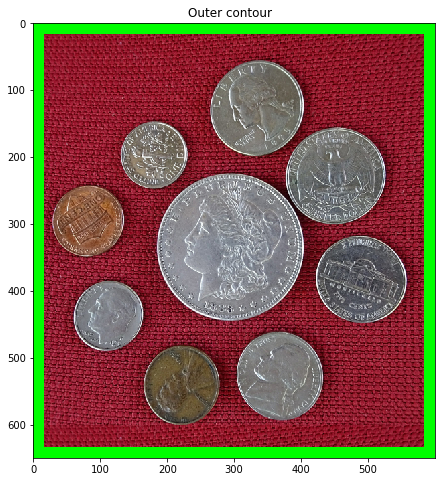

In [33]:
# Remove the inner contours
# Display the result
contours_, hierarchy_ = cv2.findContours((image_eroded_2), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
print ("Number of contours found =%d"%(len(contours_)))
image = cv2.imread(imagePath)
cv2.drawContours(image, contours_, -1, (0,255,0), 30);
    
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Outer contour  ")

So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [34]:
# Print area and perimeter of all contours
area      = np.zeros(len(contours))
perimeter = np.zeros_like(area)
for index,cnt in enumerate(contours):
    area[index]     = cv2.contourArea(cnt)
    perimeter[index] = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area[index],perimeter[index]))


Contour #1 has area = 11276.0 and perimeter = 404.2741664648056
Contour #2 has area = 14314.0 and perimeter = 459.87214505672455
Contour #3 has area = 9163.5 and perimeter = 367.4041094779968
Contour #4 has area = 14659.5 and perimeter = 458.31579625606537
Contour #5 has area = 9572.5 and perimeter = 369.06096601486206
Contour #6 has area = 39406.0 and perimeter = 750.4650716781616
Contour #7 has area = 17842.0 and perimeter = 504.35742688179016
Contour #8 has area = 8447.5 and perimeter = 346.91882717609406
Contour #9 has area = 16548.5 and perimeter = 486.4579328298569
Contour #10 has area = 388751.0 and perimeter = 2496.0


In [35]:
# Print maximum area of contour
# This will be the box that we want to remove
print("Maximum area of contour = %f"%(np.max(area)))


Maximum area of contour = 388751.000000


Text(0.5, 1.0, 'Final Image ')

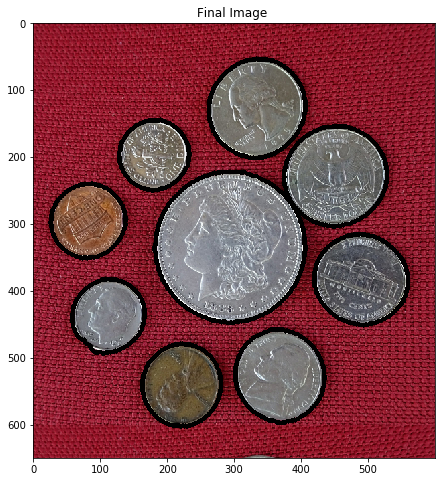

In [39]:
# Remove this contour and plot others
# sort countures 
sorted_contours = sorted(contours, key=cv2.contourArea)
# get the smallet N-1 countours
new_contours = sorted_contours[:-1]
image = cv2.imread(imagePath)
cv2.drawContours(image, new_contours, -1, (0,0,0), 6);
    
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")

Number of contours found =9


Text(0.5, 1.0, 'Final Image ')

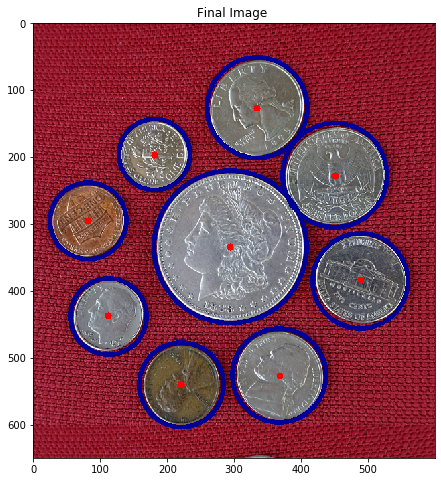

In [40]:
# Fit circles on coins

image = cv2.imread(imagePath)
print ("Number of contours found =%d"%(len(new_contours)))
for cnt in new_contours:
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    # Mark the center
    cv2.circle(image, (x,y), 5, (0,0,255), -1);
    # Fit a circle
    ((x,y),radius) = cv2.minEnclosingCircle(cnt)
    cv2.circle(image, (int(x),int(y)), int(round(radius)), (150,0,0), 6)

plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")

# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5, 1.0, 'Original Image')

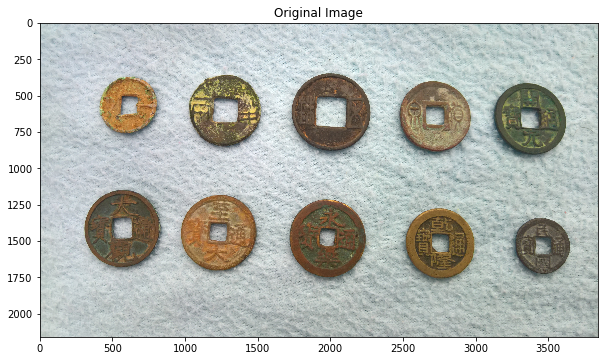

In [43]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
image = cv2.imread(imagePath)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [44]:
# Convert to grayscale
# Store in variable imageGray
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


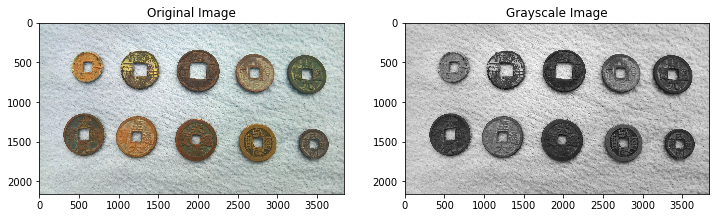

In [45]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [48]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
imageB, imageG, imageR = cv2.split(image)


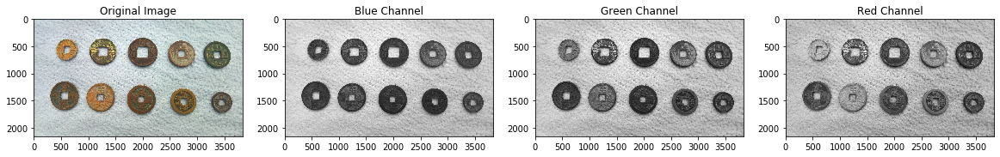

In [49]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

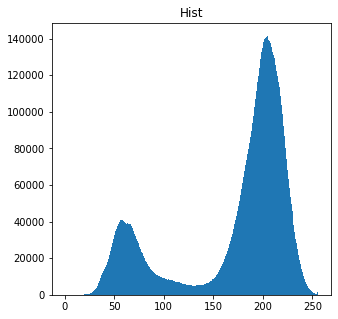

In [53]:
'''
    By looking at the contast of the images, the blue channel suits the thresholding 
    process more
'''
# let's plot the histrogram
plt.figure(figsize=(5,5))
plt.title("Hist");
plt.hist(imageB.ravel(),256,[0,256]); 
plt.show()


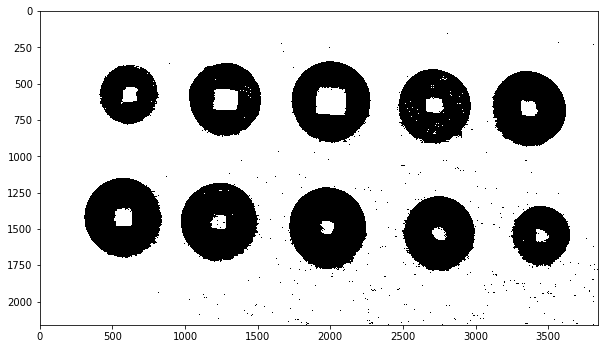

In [84]:
'''
    Above we can see the beautiful bi-nornaml distribution. 
    We can use 140 as a binary threshold boundary
'''
th, img_tresholded = cv2.threshold(imageB, 140, 255, cv2.THRESH_BINARY)
plt.imshow(img_tresholded)

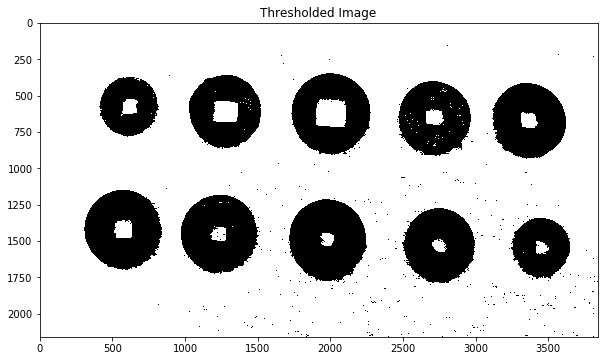

In [85]:
# Display image using matplotlib
plt.title("Thresholded Image")
plt.imshow(img_tresholded)


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

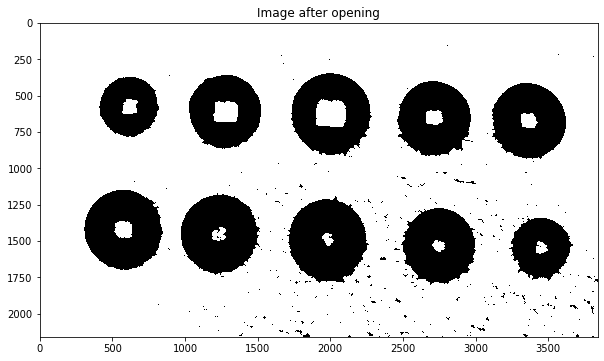

In [105]:
'''
    Now let's perform opening and closing
'''
openingSize = 3
# Selecting a elliptical kernel
element_o = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,
                                      (2 * openingSize + 1,
                                       2 * openingSize + 1),
                                      (openingSize, openingSize))
imageMorphOpened_1 = cv2.morphologyEx(img_tresholded, cv2.MORPH_OPEN,
                                    element_o, iterations=3)
plt.title("Image after opening")
plt.imshow(imageMorphOpened_1)

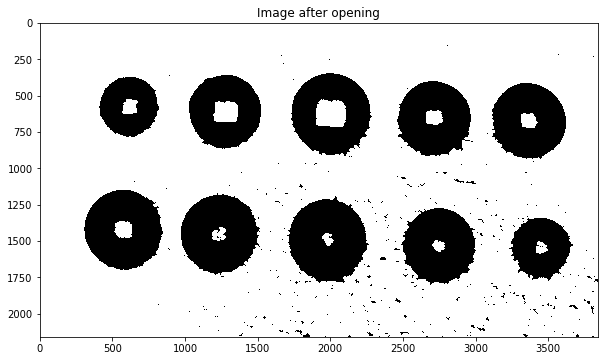

In [106]:
'''
    Let's perform further opening operations 
'''
# Selecting a elliptical kernel
element_o = cv2.getStructuringElement(cv2.MORPH_RECT,
                                      (2 * 2 + 1,
                                       2 * 2 + 1),
                                      (openingSize, openingSize))
imageMorphOpened_2 = cv2.morphologyEx(imageMorphOpened_1, cv2.MORPH_OPEN,
                                    element_o, iterations=1)
plt.title("Image after opening")
plt.imshow(imageMorphOpened_2)

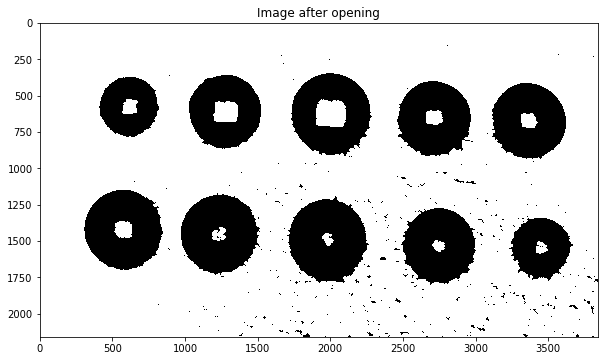

In [107]:
'''
    Opened image 
'''
plt.title("Image after opening")
plt.imshow(imageMorphOpened_2)


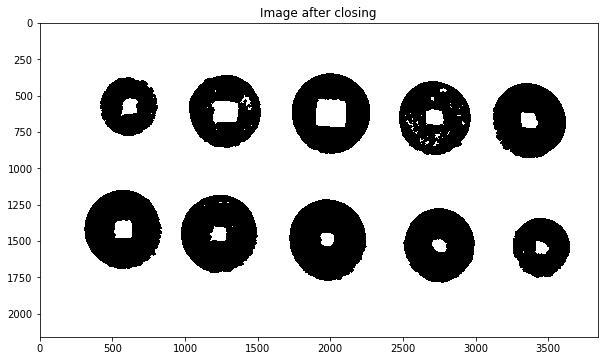

In [108]:
kernelSize = 10
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))
imageMorphClosed_1 = cv2.morphologyEx(img_tresholded, cv2.MORPH_CLOSE, element)
plt.title("Image after closing")
plt.imshow(imageMorphClosed_1)

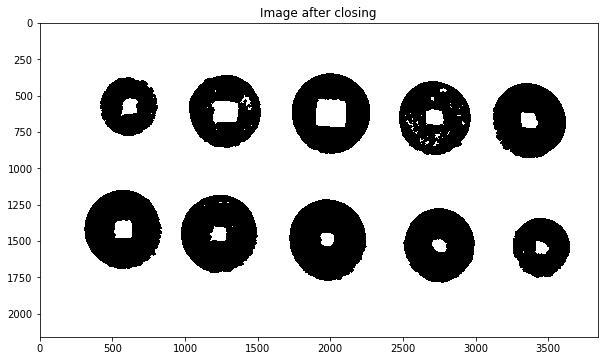

In [218]:
kernelSize = 7
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))
imageMorphClosed_2 = cv2.morphologyEx(imageMorphClosed_1, cv2.MORPH_CLOSE, element)
plt.title("Image after closing")
plt.imshow(imageMorphClosed_2)

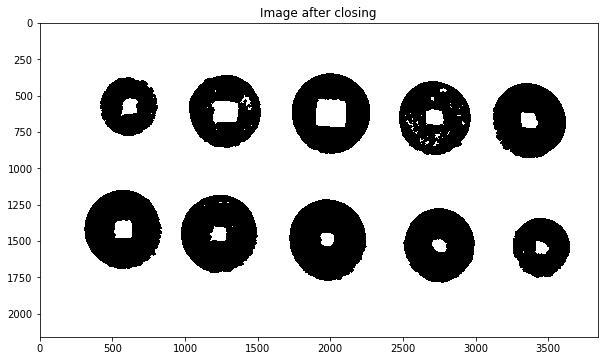

In [164]:
'''
    We can see a kernel size of 10 gave us a better result, so we will use that our closing opeartion
'''
plt.title("Image after closing")
plt.imshow(imageMorphClosed_1)


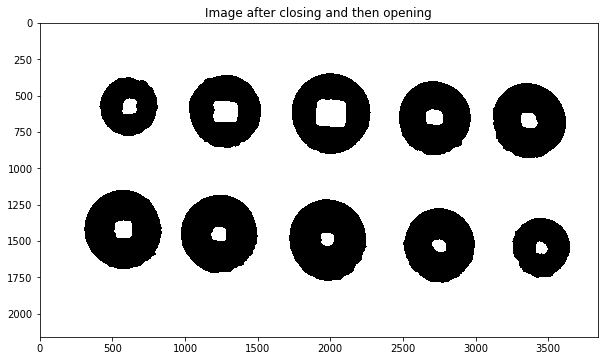

In [317]:
'''
    Now let's combine opening and closing 
'''
openingSize = 7
# Selecting a elliptical kernel
element_o = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,
                                      (2 * openingSize + 1,
                                       2 * openingSize + 1),
                                      (openingSize, openingSize))
kernelSize = 9
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))
temp                     = cv2.morphologyEx(img_tresholded, cv2.MORPH_CLOSE, element, iterations=1)
image_closed_then_opened = cv2.morphologyEx(temp, cv2.MORPH_OPEN,element_o, iterations=3)
plt.title("Image after closing and then opening")
plt.imshow(image_closed_then_opened)


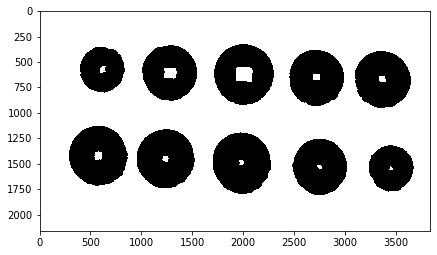

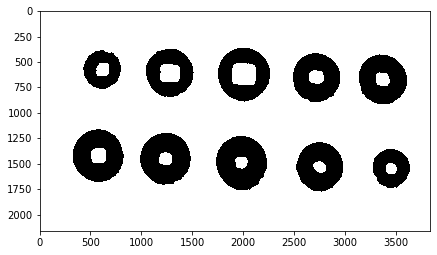

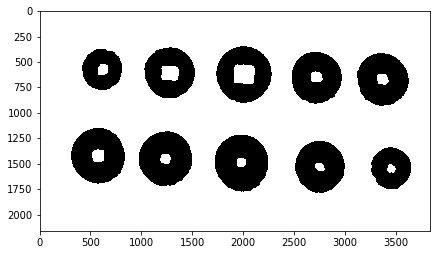

In [392]:
'''
    Let's try to remove the holes 
'''
openingSize = 3
# Selecting a elliptical kernel
element_o = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * openingSize + 1, 2 * openingSize + 1),(openingSize, openingSize))
# imageMorphOpened = cv2.morphologyEx(imageMorphOpened, cv2.MORPH_OPEN,element_o, iterations=3)

kernelSize = 7
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))

imClose = cv2.erode(image_closed_then_opened, element, iterations=3)
plt.figure(figsize=(7,7))
plt.imshow(imClose)
plt.figure(figsize=(7,7))
imOpen = cv2.dilate(imClose, element, iterations=5)
plt.imshow(imOpen)

imageMorphClosed = cv2.morphologyEx(image_closed_then_opened, cv2.MORPH_CLOSE, element, iterations=5)
plt.figure(figsize=(7,7))
plt.imshow(imageMorphClosed)

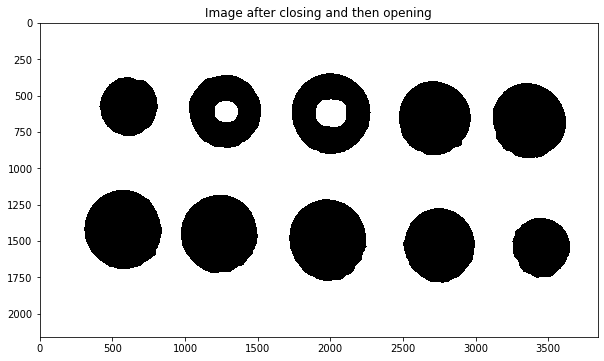

In [394]:
'''
    From the above experiments, we can see that holes get restored if they are not completely 
    removed. So let's find a big enough kernel and number of iteration so that they are erroded 
    completly and then when we won't wee them when we dialte them back
'''
kernelSize = 13
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))

im_erroded = cv2.erode(image_closed_then_opened, element, iterations=5)
im_dilated = cv2.dilate(im_erroded, element, iterations=5)
# plt.figure(figsize=(7,7))
plt.title("Image after closing and then opening")
plt.imshow(im_dilated)



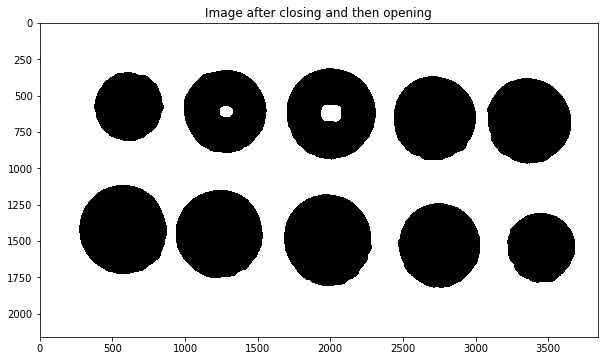

In [498]:
'''
    Now we are left with only two holes. Let's do further experiments to remove 
    these. We can try a smiple erosion
'''
kernelSize = 7
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))

im_erroded_2 = cv2.erode(im_dilated, element, iterations=5)
plt.figure(figsize=(10,10))
plt.title("Image after closing and then opening")
plt.imshow(im_erroded_2)

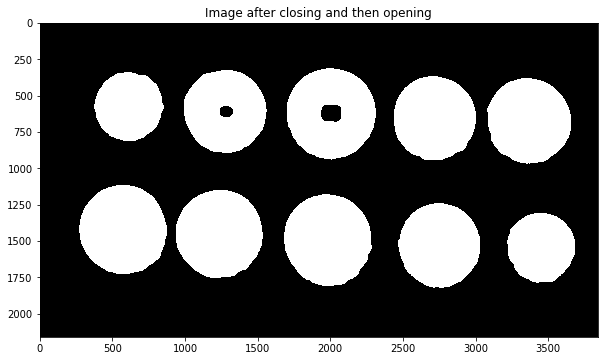

In [499]:
'''
    Not let's invert our image
'''
im_erroded_2_inv = cv2.bitwise_not(im_erroded_2)
plt.title("Image after closing and then opening")
plt.imshow(im_erroded_2_inv)

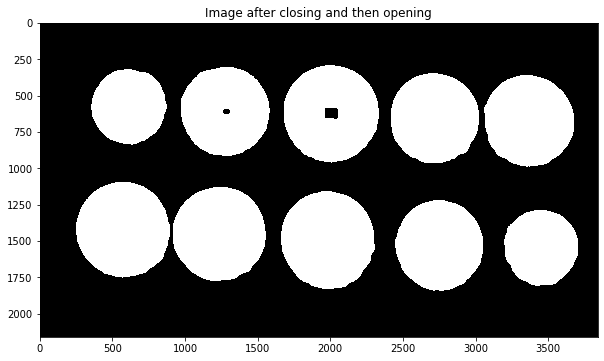

In [503]:
'''
    We can reduce the black points by performing dilation on the inverted image
'''

kernelSize = 7
# Create the Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kernelSize + 1, 2 * kernelSize + 1),
                                    (kernelSize, kernelSize))

im_dilate_2 = cv2.dilate(im_erroded_2_inv, element, iterations=3)
plt.title("Image after closing and then opening")
plt.imshow(im_dilate_2)

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [504]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [505]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [506]:
# Detect blobs
keypoints = detector.detect(cv2.bitwise_not(im_dilate_2))
print("Number of coins detected = %d"%(len(keypoints)))


Number of coins detected = 8


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [507]:
# Mark coins using image annotation concepts we have studied so far
image = cv2.imread(imagePath)
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Blue Center point 
    cv2.circle(image,(x,y),5,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Green circle boundary
    cv2.circle(image,(x,y),radius,(0,0,255),5)


Text(0.5, 1.0, 'Final Image ')

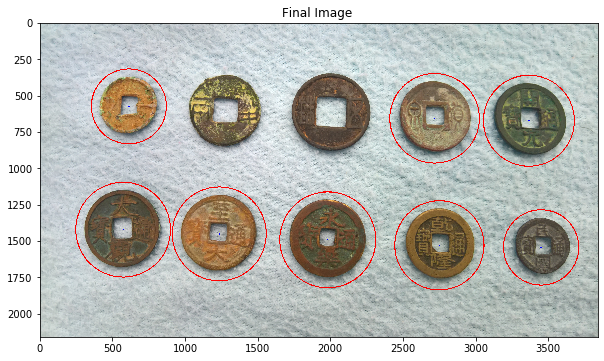

In [508]:
# Display the final image
# plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")

**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [531]:
# Find all contours in the image
_, imLabels = cv2.connectedComponents(im_dilate_2)


In [532]:
print ("Number of connected components detected =%d"%(np.max(imLabels)+1))


Number of connected components detected =11


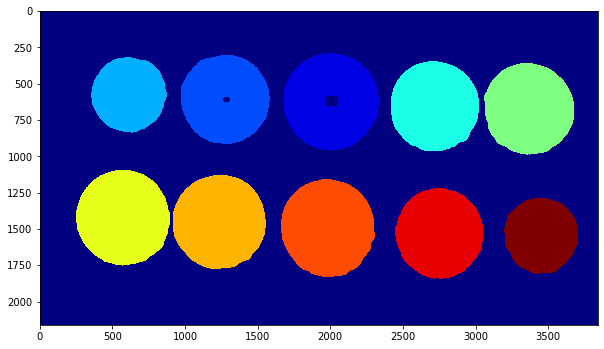

In [533]:
displayConnectedComponents(imLabels)

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [542]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(cv2.bitwise_not(im_dilate_2), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)


In [548]:
# Print the number of contours found
print ("Number of contours found =%d"%(len(contours)))
image = cv2.imread(imagePath)
cv2.drawContours(image, contours, -1, (250,0,0), 30);
    
    


Number of contours found =13


Text(0.5, 1.0, 'Final Image ')

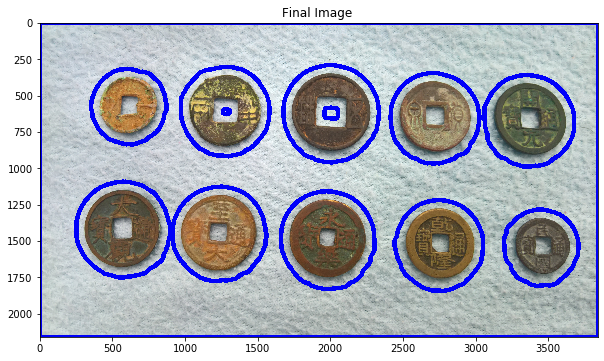

In [549]:
# Draw all contours
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")


Number of contours found =1


Text(0.5, 1.0, 'Outer contour  ')

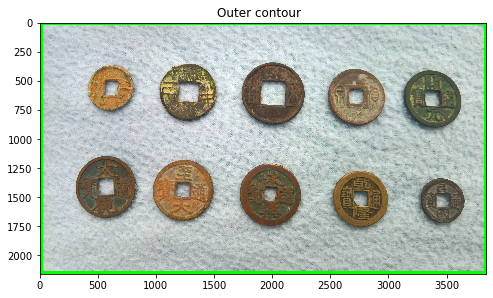

In [552]:
contours_, hierarchy_ = cv2.findContours(cv2.bitwise_not(im_dilate_2), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
print ("Number of contours found =%d"%(len(contours_)))
image = cv2.imread(imagePath)
cv2.drawContours(image, contours_, -1, (0,255,0), 50);
    
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Outer contour  ")

What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [564]:
# Print area and perimeter of all contours
area      = np.zeros(len(contours))
perimeter = np.zeros_like(area)
for index,cnt in enumerate(contours):
    area[index]     = cv2.contourArea(cnt)
    perimeter[index] = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area[index],perimeter[index]))


Contour #1 has area = 209959.0 and perimeter = 1726.1261073350906
Contour #2 has area = 295580.0 and perimeter = 2047.9738664627075
Contour #3 has area = 341360.5 and perimeter = 2199.3292088508606
Contour #4 has area = 328454.0 and perimeter = 2156.743422985077
Contour #5 has area = 334262.5 and perimeter = 2179.672349333763
Contour #6 has area = 1296.0 and perimeter = 138.56854164600372
Contour #7 has area = 6278.0 and perimeter = 313.19595861434937
Contour #8 has area = 308075.5 and perimeter = 2088.902794480324
Contour #9 has area = 299850.5 and perimeter = 2064.3342583179474
Contour #10 has area = 209644.5 and perimeter = 1730.0256066322327
Contour #11 has area = 295869.5 and perimeter = 2045.446954369545
Contour #12 has area = 344829.0 and perimeter = 2204.8855546712875
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [565]:
# Print maximum area of contour
# This will be the box that we want to remove
print("Maximum area of contour = %f"%(np.max(area)))


Maximum area of contour = 8288401.000000


Text(0.5, 1.0, 'Final Image ')

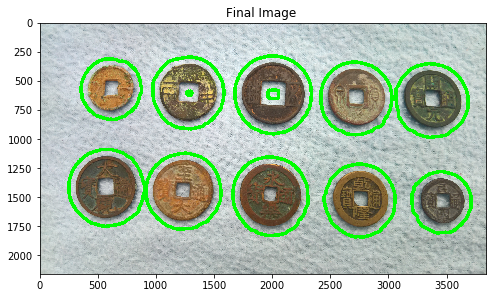

In [566]:
# Remove this contour and plot others
# sort countures 
sorted_contours = sorted(contours, key=cv2.contourArea)
# get the smallet N-1 countours
new_contours = sorted_contours[:-1]
image = cv2.imread(imagePath)
cv2.drawContours(image, new_contours, -1, (0,255,0), 30);
    
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")

Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [569]:
# Print sorted area of contours
for index,cnt in enumerate(new_contours):
    print (cv2.contourArea(cnt))

1296.0
6278.0
209644.5
209959.0
295580.0
295869.5
299850.5
308075.5
328454.0
334262.5
341360.5
344829.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

Number of contours =  10


Text(0.5, 1.0, 'Final Image ')

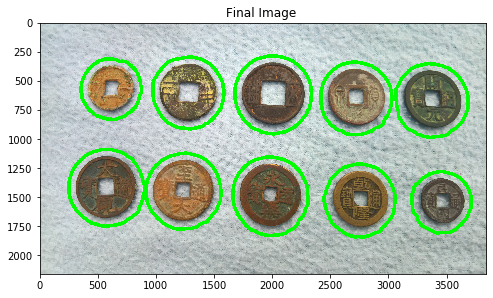

In [570]:
# Remove the 2 inner contours and plot others
# sort countures 
new_contours_2 = new_contours[2:]
print ("Number of contours = ", len (new_contours_2))
image = cv2.imread(imagePath)
cv2.drawContours(image, new_contours_2, -1, (0,255,0), 30);
    
plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")

Number of contours found =10


Text(0.5, 1.0, 'Final Image ')

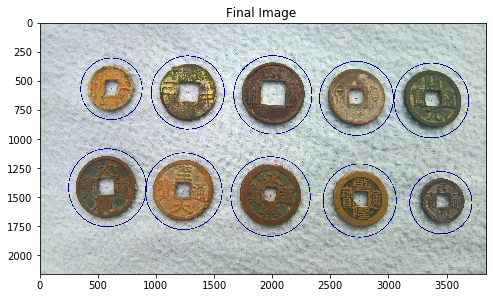

In [571]:
# Fit circles on coins
image = cv2.imread(imagePath)
print ("Number of contours found =%d"%(len(new_contours_2)))
for cnt in new_contours_2:
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    # Mark the center
    cv2.circle(image, (x,y), 5, (0,0,255), -1);
    # Fit a circle
    ((x,y),radius) = cv2.minEnclosingCircle(cnt)
    cv2.circle(image, (int(x),int(y)), int(round(radius)), (150,0,0), 6)

plt.figure(figsize=(8,8))
plt.imshow(image[:,:,::-1]);
plt.title("Final Image ")
